In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import matplotlib.colors as mcolors
from sklearn.ensemble import RandomForestRegressor
import seaborn as sns
import cartopy.crs as ccrs
import matplotlib.colors as mcolors
import cartopy.mpl.ticker as cticker
import warnings
warnings.filterwarnings("ignore")

In [44]:
# filepath = "C:/Users/dutts/OneDrive - Johns Hopkins/Documents/ML-Plankton/"
# chartpath = "C:/Users/dutts/OneDrive - Johns Hopkins/Documents/ML-Plankton/XAI/charts/"
filepath = "/Users/sdutta/OneDrive - Johns Hopkins/Documents/ML-Plankton/"
chartpath = "/Users/sdutta/OneDrive - Johns Hopkins/Documents/ML-Plankton/charts/"

In [3]:
def convert360_180(ds):
    """
    convert longitude from 0-360 to -180-180
    """
    #check if already 
    attrs = ds['lon'].attrs
    if ds['lon'].min()>= 0:
        with xr.set_options(keep_attrs=True):
            ds.coords['lon'] = (ds['lon'] + 180) % 360 - 180
        ds = ds.sortby('lon')
    return ds

In [4]:
din = xr.open_dataset(filepath + "kostadinov/data/DataLog10T_final.nc")
din = din.drop_vars('Log10Phc')
dsin = convert360_180(din)
din = din.sortby(['lat','lon','month'])
din = din.rename({'tos':'sst','sos':'sal','si':'sil','wo5':'w50'})
din

<xarray.Dataset> Size: 56MB
Dimensions:  (lon: 360, lat: 162, month: 12)
Coordinates:
  * lat      (lat) float64 1kB -77.5 -76.5 -75.5 -74.5 ... 80.5 81.5 82.5 83.5
  * month    (month) uint64 96B 1 2 3 4 5 6 7 8 9 10 11 12
  * lon      (lon) float64 3kB -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Data variables:
    dfe      (lon, lat, month) float64 6MB ...
    mld      (lon, lat, month) float64 6MB ...
    nh4      (lon, lat, month) float64 6MB ...
    no3      (lon, lat, month) float64 6MB ...
    po4      (lon, lat, month) float64 6MB ...
    rsn      (lon, lat, month) float64 6MB ...
    sst      (lon, lat, month) float64 6MB ...
    sal      (lon, lat, month) float64 6MB ...
    w50      (lon, lat, month) float64 6MB ...
    sil      (lon, lat, month) float64 6MB ...

In [5]:
dk = xr.open_dataset(filepath + "kostadinov/kostadinov_composite_variable_fill.nc")
dc = xr.open_dataset(filepath + "copernicus/2010-2023_cmems_bgc_plankton_variable_fill.nc")
dm = xr.open_dataset(filepath + "modis/2002_2023_modis_variable_fill.nc")

In [6]:
dk = dk.rename({'phyc':'phyck','mcro':'mcrok','nano':'nanok','pico':'picok','logphyc':'logphyck',
                'logmcro':'logmcrok','lognano':'lognanok','logpico':'logpicok'})
dk = dk[['logphyck','logmcrok','lognanok','logpicok']]
dk

<xarray.Dataset> Size: 11MB
Dimensions:   (lat: 162, month: 12, lon: 360)
Coordinates:
  * lat       (lat) float64 1kB -77.5 -76.5 -75.5 -74.5 ... 80.5 81.5 82.5 83.5
  * month     (month) uint64 96B 1 2 3 4 5 6 7 8 9 10 11 12
  * lon       (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Data variables:
    logphyck  (lat, month, lon) float32 3MB ...
    logmcrok  (lat, month, lon) float32 3MB ...
    lognanok  (lat, month, lon) float32 3MB ...
    logpicok  (lat, month, lon) float32 3MB ...

In [7]:
print(dk['logphyck'].min().values, dk['logphyck'].max().values)

0.10500702 2.3087857


In [8]:
dc = dc.rename({'chla':'chlac','mcro':'mcroc','nano':'nanoc','pico':'picoc','logchla':'logchlac',
                'logmcro':'logmcroc','lognano':'lognanoc','logpico':'logpicoc'})
dc = dc[['logchlac','logmcroc','lognanoc','logpicoc']]
dc

<xarray.Dataset> Size: 11MB
Dimensions:   (lat: 161, month: 12, lon: 360)
Coordinates:
  * lat       (lat) float64 1kB -77.5 -76.5 -75.5 -74.5 ... 79.5 80.5 81.5 82.5
  * month     (month) uint64 96B 1 2 3 4 5 6 7 8 9 10 11 12
  * lon       (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Data variables:
    logchlac  (lat, month, lon) float32 3MB ...
    logmcroc  (lat, month, lon) float32 3MB ...
    lognanoc  (lat, month, lon) float32 3MB ...
    logpicoc  (lat, month, lon) float32 3MB ...

In [9]:
dm = dm.rename({'chla':'chlam','mcro':'mcrom','nano':'nanom','pico':'picom','logchla':'logchlam',
                'logmcro':'logmcrom','lognano':'lognanom','logpico':'logpicom'})
dm = dm[['logchlam','logmcrom','lognanom','logpicom']]
dm

<xarray.Dataset> Size: 11MB
Dimensions:   (lat: 162, month: 12, lon: 360)
Coordinates:
  * lat       (lat) float64 1kB -77.5 -76.5 -75.5 -74.5 ... 80.5 81.5 82.5 83.5
  * month     (month) uint64 96B 1 2 3 4 5 6 7 8 9 10 11 12
  * lon       (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Data variables:
    logchlam  (lat, month, lon) float32 3MB ...
    logmcrom  (lat, month, lon) float32 3MB ...
    lognanom  (lat, month, lon) float32 3MB ...
    logpicom  (lat, month, lon) float32 3MB ...

In [10]:
ds = xr.merge([din,dk,dc,dm])
ds

<xarray.Dataset> Size: 90MB
Dimensions:   (lat: 162, month: 12, lon: 360)
Coordinates:
  * lat       (lat) float64 1kB -77.5 -76.5 -75.5 -74.5 ... 80.5 81.5 82.5 83.5
  * month     (month) uint64 96B 1 2 3 4 5 6 7 8 9 10 11 12
  * lon       (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Data variables: (12/22)
    dfe       (lon, lat, month) float64 6MB ...
    mld       (lon, lat, month) float64 6MB ...
    nh4       (lon, lat, month) float64 6MB ...
    no3       (lon, lat, month) float64 6MB ...
    po4       (lon, lat, month) float64 6MB ...
    rsn       (lon, lat, month) float64 6MB ...
    ...        ...
    lognanoc  (lat, month, lon) float32 3MB nan -0.8664 -0.7689 ... nan nan nan
    logpicoc  (lat, month, lon) float32 3MB nan -0.795 -0.7465 ... nan nan nan
    logchlam  (lat, month, lon) float32 3MB ...
    logmcrom  (lat, month, lon) float32 3MB ...
    lognanom  (lat, month, lon) float32 3MB ...
    logpicom  (lat, month, lon) float32 3MB ...

In [11]:
print(ds['logphyck'].min().values, ds['logphyck'].max().values)

0.10500702 2.3087857


In [12]:
df = ds.to_dataframe()
df = df.astype("float32")
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 430200 entries, (np.float64(-77.5), np.uint64(1), np.float64(-178.5)) to (np.float64(82.5), np.uint64(12), np.float64(81.5))
Data columns (total 22 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   dfe       430200 non-null  float32
 1   mld       430200 non-null  float32
 2   nh4       430200 non-null  float32
 3   no3       430200 non-null  float32
 4   po4       430200 non-null  float32
 5   rsn       430200 non-null  float32
 6   sst       430200 non-null  float32
 7   sal       430200 non-null  float32
 8   w50       430200 non-null  float32
 9   sil       430200 non-null  float32
 10  logphyck  430200 non-null  float32
 11  logmcrok  430200 non-null  float32
 12  lognanok  430200 non-null  float32
 13  logpicok  430200 non-null  float32
 14  logchlac  430200 non-null  float32
 15  logmcroc  430200 non-null  float32
 16  lognanoc  430200 non-null  float32
 17  logpicoc  430200 non-null  

### Random Forest

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score
from sklearn.metrics import root_mean_squared_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.utils import shuffle
from sklearn.base import BaseEstimator, TransformerMixin

# class CustomMinMaxScaler(BaseEstimator, TransformerMixin):
#     def __init__(self, feature_range=(0, 10)):
#         self.feature_range = feature_range
#         # Delay instantiation to fit time so sklearn can inspect parameters
#         self.scaler_ = None

#     def fit(self, X, y=None):
#         self.scaler_ = MinMaxScaler(feature_range=self.feature_range)
#         self.scaler_.fit(X)
#         return self

#     def transform(self, X):
#         X_scaled = self.scaler_.transform(X)
#         return pd.DataFrame(X_scaled, columns=X.columns, index=X.index)

In [14]:
def RF(Xs_train, Xs_test, y_train, y_test):
    rf = RandomForestRegressor(
        n_estimators=50,
        bootstrap=True,
        max_features="sqrt",
        min_samples_leaf=5,
        random_state=101
        )
    model=rf.fit(Xs_train, y_train)
    y_test_pred = model.predict(Xs_test)
    re = root_mean_squared_error(y_test, y_test_pred)
    r2 = r2_score(y_test, y_test_pred)
    rn = re / y_test.std()
    print("RMSE     : ",re)
    print("Norm RMSE: ",rn)
    print("R2 Score : ",r2)
    return model

#### Random Forest Kostadinov

In [15]:
df = shuffle(df)
psc = ['logphyck','logmcrok','lognanok','logpicok','logchlac','logmcroc','lognanoc','logpicoc','logchlam','logmcrom','lognanom','logpicom']
inputs = ['dfe','mld', 'nh4', 'no3', 'po4', 'rsn', 'sal', 'sst', 'sil', 'w50']
X = df.loc[:, ['dfe','mld', 'nh4', 'no3', 'po4', 'rsn', 'sal', 'sst', 'sil', 'w50']]
ykphyc = df['logphyck']
ykmcro = df['logmcrok']
yknano = df['lognanok']
ykpico = df['logpicok']

In [16]:
ycchla = df['logchlac']
ycmcro = df['logmcroc']
ycnano = df['lognanoc']
ycpico = df['logpicoc']

In [17]:
yhchla = df['logchlam']
yhmcro = df['logmcrom']
yhnano = df['lognanom']
yhpico = df['logpicom']

In [18]:
X.head()

dfe         mld       nh4           no3  \
lat   month lon                                                        
-30.5 12     110.5  3.954922e-07   35.948002  0.000012  0.000000e+00   
-66.5 7     -112.5  2.571810e-07  168.574005  0.000054  2.703490e-02   
-27.5 7      110.5  5.129709e-07   70.819000  0.000048  3.470118e-04   
 5.5  5     -142.5  1.207695e-07   55.458000  0.000276  3.542731e-04   
      6      164.5  1.461587e-07   71.460999  0.000105  3.389135e-07   

                         po4         rsn        sal        sst       sil  \
lat   month lon                                                            
-30.5 12     110.5  0.000118  296.851837  35.666889  20.270109  0.002192   
-66.5 7     -112.5  0.001965    0.911111  33.900299  -0.804010  0.041155   
-27.5 7      110.5  0.000141  121.766670  35.504189  21.003710  0.002579   
 5.5  5     -142.5  0.000483  214.115387  34.543610  27.639500  0.000084   
      6      164.5  0.000055  213.057693  34.375813  29.159109  0.001167   

                             w50  
lat   month lon                   
-30.5 12     110.5 -2.106101e-06  
-66.5 7     -112.5  1.065545e-06  
-27.5 7      110.5 -3.410908e-06  
 5.5  5     -142.5 -2.512924e-07  
      6      164.5  1.796581e-06

In [19]:
n = int(df.shape[0] * 0.7)
X_train = X.iloc[:n]
X_test = X.iloc[n:]
scaler = MinMaxScaler(feature_range=(0,10))
xscaler = scaler.fit(X_train)
Xs_train = xscaler.transform(X_train)
Xs_train = pd.DataFrame(Xs_train, columns=X_train.columns, index=X_train.index)
Xs_test = xscaler.transform(X_test)
Xs_test = pd.DataFrame(Xs_test, columns=X_test.columns, index=X_test.index)
ykphyc_train = ykphyc[:n]
ykphyc_test  = ykphyc[n:]
ykmcro_train = ykmcro[:n]
ykmcro_test  = ykmcro[n:]
yknano_train = yknano[:n]
yknano_test  = yknano[n:]
ykpico_train = ykpico[:n]
ykpico_test  = ykpico[n:]

In [20]:
kosta_phyc = RF(Xs_train, Xs_test, ykphyc_train, ykphyc_test)

RMSE     :  0.11513081519129414
Norm RMSE:  0.35381335
R2 Score :  0.8748151303042047


Reference scores  
RMSE phyc:  0.11565631449027938  
Normalised RMSE phyc:  0.3546560387344827  
R2 Score phyc:  0.874218364787711

In [21]:
kosta_mcro = RF(Xs_train, Xs_test, ykmcro_train, ykmcro_test)

RMSE     :  0.22262276016793253
Norm RMSE:  0.29575196
R2 Score :  0.912530110182764


Reference values  
RMSE:  0.25656060951601983  
Normalised RMSE:  0.2945367249892131  
R2 Score:  0.9132476145598218

In [22]:
kosta_nano = RF(Xs_train, Xs_test, yknano_train, yknano_test)

RMSE     :  0.1297038371409797
Norm RMSE:  0.2687974
R2 Score :  0.9277474017197461


Reference values  
RMSE : 0.15242339372630892  
Normalised RMSE:  0.28000871581736214  
R2 Score : 0.9215946643976406

In [23]:
kosta_pico = RF(Xs_train, Xs_test, ykpico_train, ykpico_test)

RMSE     :  0.07588312891938939
Norm RMSE:  0.26905155
R2 Score :  0.9276107009609006


Reference Values   
RMSE : 0.047544904111293286  
Normalised RMSE:  0.2961349881061683  
R2 Score : 0.912303560272036

#### Random Forest Copernicus

In [24]:
ycchla_train = ycchla[:n]
ycchla_test  = ycchla[n:]
ycmcro_train = ycmcro[:n]
ycmcro_test  = ycmcro[n:]
ycnano_train = ycnano[:n]
ycnano_test  = ycnano[n:]
ycpico_train = ycpico[:n]
ycpico_test  = ycpico[n:]

In [25]:
coper_chla = RF(Xs_train, Xs_test, ycchla_train, ycchla_test)

RMSE     :  0.1073540202535851
Norm RMSE:  0.2847892
R2 Score :  0.9188944791652716


RMSE:  0.10753190472663597  
Normalized RMSE:  0.281222857266973  

R2 Score:  0.92091324593043  63

In [26]:
coper_mcro = RF(Xs_train, Xs_test, ycmcro_train, ycmcro_test)

RMSE     :  0.12462791208541889
Norm RMSE:  0.23504464
R2 Score :  0.9447535933739707


RMSE : 0.15998159875517007  
Normalised RMSE: 0.317352856052321  

R2 Score : 0.8992865807233124

In [27]:
coper_nano = RF(Xs_train, Xs_test, ycnano_train, ycnano_test)

RMSE     :  0.10128519081555054
Norm RMSE:  0.28848603
R2 Score :  0.9167751476903168


RMSE : 0.138577588011663  
Normalised RMSE: 0.3250834078528443  

R2 Score : 0.89432016510666  15

In [28]:
coper_pico = RF(Xs_train, Xs_test, ycpico_train, ycpico_test)

RMSE     :  0.10620837832675245
Norm RMSE:  0.3406145
R2 Score :  0.883980860756688


RMSE : 0.09125346088571347  
Normalised RMSE: 0.3197280460855604 

R2 Score : 0.8977733837392335

#### Random Forest MODIS

In [29]:
yhchla_train = yhchla[:n]
yhchla_test  = yhchla[n:]
yhmcro_train = yhmcro[:n]
yhmcro_test  = yhmcro[n:]
yhnano_train = yhnano[:n]
yhnano_test  = yhnano[n:]
yhpico_train = yhpico[:n]
yhpico_test  = yhpico[n:]

In [30]:
modis_chla = RF(Xs_train, Xs_test, yhchla_train, yhchla_test)

RMSE     :  0.11842127057980971
Norm RMSE:  0.27507633
R2 Score :  0.9243324269888056


In [31]:
modis_mcro = RF(Xs_train, Xs_test, yhmcro_train, yhmcro_test)

RMSE     :  0.22422466528940665
Norm RMSE:  0.27622557
R2 Score :  0.9236988468924259


In [32]:
modis_nano = RF(Xs_train, Xs_test, yhnano_train, yhnano_test)

RMSE     :  0.12665635238789427
Norm RMSE:  0.24616565
R2 Score :  0.9394020025476743


In [33]:
modis_pico = RF(Xs_train, Xs_test, yhpico_train, yhpico_test)

RMSE     :  0.08962977193516987
Norm RMSE:  0.26686716
R2 Score :  0.928781370240881


### Median Sensitivity Analysis

In [34]:
Xs = scaler.fit_transform(X)
Xs = pd.DataFrame(Xs, columns=X.columns, index=X.index)
print(Xs.columns)

Index(['dfe', 'mld', 'nh4', 'no3', 'po4', 'rsn', 'sal', 'sst', 'sil', 'w50'], dtype='object')


In [35]:
def median_dataset(Xs, inp, q=0.5):
    Xs5 = Xs.copy()
    for col in Xs5.columns:
        if col==inp:
            Xs5[col] = Xs5[col].quantile(q, interpolation='linear')
        else:
            Xs5[col] = Xs5[col]
    # print(Xs5)
    return Xs5

In [36]:
Xs5dfe = median_dataset(Xs, 'dfe')
Xs5mld = median_dataset(Xs, 'mld')
Xs5nh4 = median_dataset(Xs, 'nh4')
Xs5no3 = median_dataset(Xs, 'no3')
Xs5po4 = median_dataset(Xs, 'po4')
Xs5rsn = median_dataset(Xs, 'rsn')
Xs5sal = median_dataset(Xs, 'sal')
Xs5sst = median_dataset(Xs, 'sst')
Xs5sil = median_dataset(Xs, 'sil')
Xs5w50 = median_dataset(Xs, 'w50')

In [37]:
def calc_rn(model, X, y):
    y_pred = model.predict(X)
    re = np.round(root_mean_squared_error(y, y_pred),3)
    rn = np.round(re/y.std(),3)
    r2 = np.round(r2_score(y, y_pred),3)
    # print(y.name)
    y_label = y.name[3:] if y.name else "unknown"
    # print(f'RMSE      {y_label}:',re)
    # print(f"Norm RMSE {y_label}:",rn)
    # print(f"R2_score  {y_label}:",r2)
    return rn

In [38]:
def median_importance(model, Xs, Xs5_list, y, metric=root_mean_squared_error, random_state=42):
    """
    Compute permutation importance for each feature with multiple shuffles.

    Parameters:
    - model: trained model with .predict() method
    - X: pd.DataFrame, test features
    - y: pd.Series or np.ndarray, true labels
    - metric: scoring function (default: mean_squared_error)
    - squared: bool, if False use RMSE instead of MSE
    - n_repeats: number of times to permute each feature
    - random_state: int or None, controls reproducibility of shuffling

    Returns:
    - pd.DataFrame with mean importance and standard deviation
    """
    rng = np.random.default_rng(random_state)

    # baseline score
    actual_rn = calc_rn(model, Xs, y)

    results = []
    for feature, Xs5 in zip(Xs.columns, Xs5_list):
        med_rn = calc_rn(model, Xs5, y)
        diff = (med_rn - actual_rn)
        results.append({
            "feature": feature,
            "NormRMSE": diff
            })

    df = pd.DataFrame(results)
    # print(df)

    # return pd.DataFrame(results).sort_values(by="rmse", ascending=False).reset_index(drop=True)
    return df

In [39]:
Xs5_list = [Xs5dfe, Xs5mld, Xs5nh4, Xs5no3, Xs5po4, Xs5rsn, Xs5sal, Xs5sst, Xs5sil, Xs5w50]
rn_kostaphyc = median_importance(kosta_phyc, Xs, Xs5_list, ykphyc)
rn_kostamcro = median_importance(kosta_mcro, Xs, Xs5_list, ykmcro)
rn_kostanano = median_importance(kosta_nano, Xs, Xs5_list, yknano)
rn_kostapico = median_importance(kosta_pico, Xs, Xs5_list, ykpico)
rn_coperchla = median_importance(coper_chla, Xs, Xs5_list, ycchla)
rn_copermcro = median_importance(coper_mcro, Xs, Xs5_list, ycmcro)
rn_copernano = median_importance(coper_nano, Xs, Xs5_list, ycnano)
rn_coperpico = median_importance(coper_pico, Xs, Xs5_list, ycpico)
rn_modischla = median_importance(modis_chla, Xs, Xs5_list, yhchla)
rn_modismcro = median_importance(modis_mcro, Xs, Xs5_list, yhmcro)
rn_modisnano = median_importance(modis_nano, Xs, Xs5_list, yhnano)
rn_modispico = median_importance(modis_pico, Xs, Xs5_list, yhpico)

In [40]:
rn_kostaphyc

,feature,NormRMSE
0,dfe,0.276
1,mld,0.086
2,nh4,0.162
3,no3,0.113
4,po4,0.086
5,rsn,0.500
6,sal,0.119
7,sst,0.202
8,sil,0.036
9,w50,0.018


In [41]:
blue=mcolors.TABLEAU_COLORS['tab:blue']
orange=mcolors.TABLEAU_COLORS['tab:orange']
green=mcolors.TABLEAU_COLORS['tab:green']
red=mcolors.TABLEAU_COLORS['tab:red']
purple=mcolors.TABLEAU_COLORS['tab:purple']
brown=mcolors.TABLEAU_COLORS['tab:brown']
pink=mcolors.TABLEAU_COLORS['tab:pink']
olive=mcolors.TABLEAU_COLORS['tab:olive']
cyan=mcolors.TABLEAU_COLORS['tab:cyan']
gray=mcolors.TABLEAU_COLORS['tab:gray']

In [42]:
my_colors={'dfe':brown,'mld':olive, 'nh4':purple,'no3':pink, 'po4':cyan, 'rsn':orange,
           'sal':green, 'sst':red, 'sil':blue, 'w50':gray}

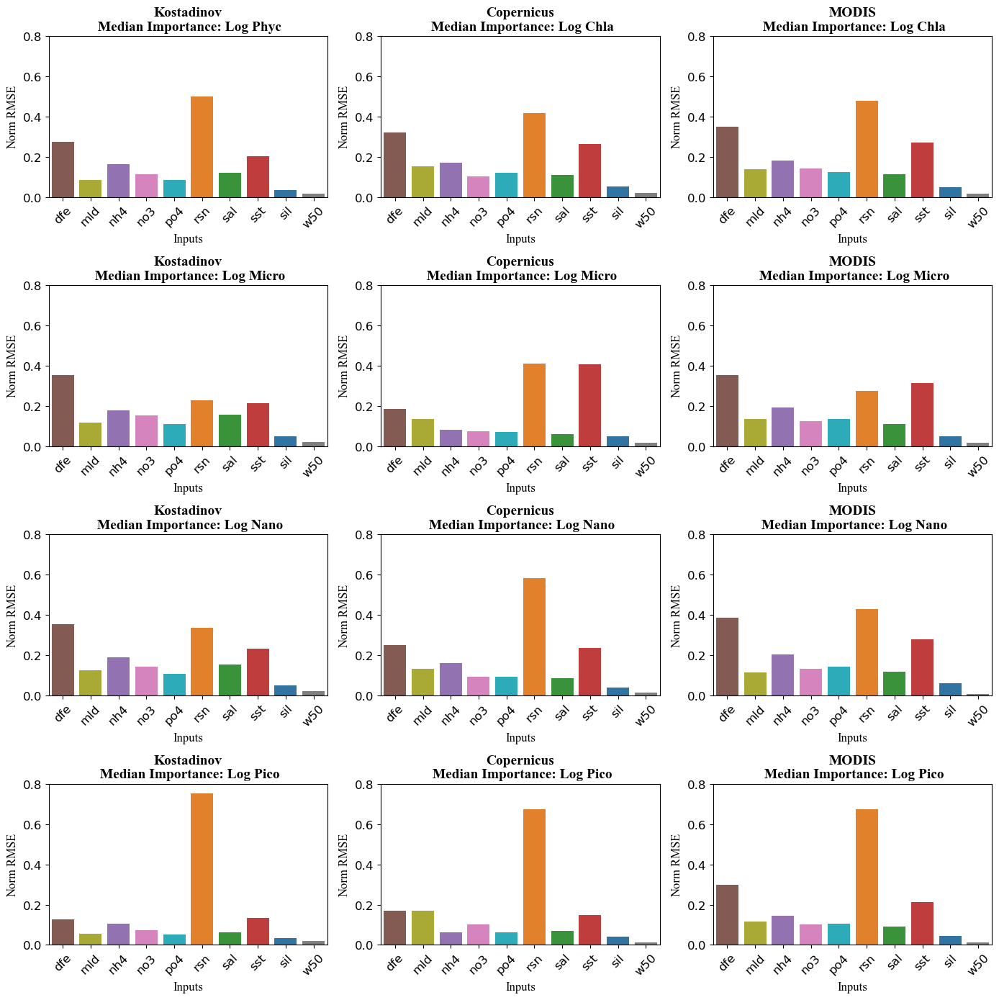

In [45]:
# Define datasets and titles
datasets = [
    {'df': rn_kostaphyc, 'x':'feature', 'y': 'NormRMSE', 'title': 'Kostadinov\n Median Importance: Log Phyc'},
    {'df': rn_coperchla, 'x':'feature', 'y': 'NormRMSE', 'title': 'Copernicus\n Median Importance: Log Chla'},
    {'df': rn_modischla, 'x':'feature', 'y': 'NormRMSE', 'title': 'MODIS\n Median Importance: Log Chla'},
    {'df': rn_kostamcro, 'x':'feature', 'y': 'NormRMSE', 'title': 'Kostadinov\n Median Importance: Log Micro'},
    {'df': rn_copermcro, 'x':'feature', 'y': 'NormRMSE', 'title': 'Copernicus\n Median Importance: Log Micro'},
    {'df': rn_modismcro, 'x':'feature', 'y': 'NormRMSE', 'title': 'MODIS\n Median Importance: Log Micro'},
    {'df': rn_kostanano, 'x':'feature', 'y': 'NormRMSE', 'title': 'Kostadinov\n Median Importance: Log Nano'},
    {'df': rn_copernano, 'x':'feature', 'y': 'NormRMSE', 'title': 'Copernicus\n Median Importance: Log Nano'},
    {'df': rn_modisnano, 'x':'feature', 'y': 'NormRMSE', 'title': 'MODIS\n Median Importance: Log Nano'},
    {'df': rn_kostapico, 'x':'feature', 'y': 'NormRMSE', 'title': 'Kostadinov\n Median Importance: Log Pico'},
    {'df': rn_coperpico, 'x':'feature', 'y': 'NormRMSE', 'title': 'Copernicus\n Median Importance: Log Pico'},
    {'df': rn_modispico, 'x':'feature', 'y': 'NormRMSE', 'title': 'MODIS\n Median Importance: Log Pico'}
]

# Font settings
font = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 14, 'fontweight': 'bold'}
fonttxt = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 12}

# Create subplots (4 rows × 3 columns)
fig, axes = plt.subplots(4, 3, figsize=(14, 14), sharex=False, sharey=False, dpi=100)
axes = axes.flatten()  # Flatten to 1D list for easy iteration

# Plot each dataset
for ax, data in zip(axes, datasets):
    sns.barplot(x=data['x'], y=data['y'], data=data['df'], ax=ax, palette=my_colors, hue=data['x'], legend=False)
    
    ax.set_title(f"{data['title']}", fontdict=font)
    ax.set_ylabel("Norm RMSE", fontdict=fonttxt)
    ax.set_ylim([0.0, 0.8])
    ax.set_xlabel("Inputs", fontdict=fonttxt)
    ax.yaxis.set_tick_params(labelsize=12)
    ax.xaxis.set_tick_params(labelsize=12)
    ax.tick_params(axis='x', labelrotation=45)

    
    # Remove legend if present
    if ax.get_legend():
        ax.get_legend().remove()

# Hide any unused axes (in case datasets < total subplots)
for ax in axes[len(datasets):]:
    ax.axis('off')

plt.tight_layout()
fig.savefig(chartpath + "med_imp_multigroup_scratch.jpg",dpi=200,bbox_inches='tight')
plt.show()

### Median Replacement Anomaly

In [44]:
df = df.sort_values(['month','lat','lon'])
X = df.loc[:, inputs]
Xs = scaler.fit_transform(X)
Xs = pd.DataFrame(Xs, columns=X.columns, index=X.index)
Xs.head()

dfe       mld       nh4       no3       po4  \
lat   month lon                                                        
-77.5 1     -178.5  0.208484  0.506408  4.231577  3.450822  4.077281   
            -177.5  0.205167  0.491433  4.014312  3.567460  4.129741   
            -176.5  0.235446  0.478328  3.806712  3.678837  4.184831   
            -175.5  0.202580  0.467861  3.602718  3.776644  4.234338   
            -174.5  0.239541  0.460787  3.368932  3.859270  4.277099   

                         rsn       sal       sst       sil       w50  
lat   month lon                                                       
-77.5 1     -178.5  4.014052  8.057380  0.469185  4.552131  5.115657  
            -177.5  3.865146  8.053420  0.452645  4.522581  5.106133  
            -176.5  3.925302  8.049719  0.437974  4.497089  5.074835  
            -175.5  3.925302  8.046313  0.425598  4.470600  5.033265  
            -174.5  3.741394  8.043292  0.415659  4.442318  4.965065

In [45]:
dp = df.loc[:,['logphyck','logmcrok','lognanok','logpicok','logchlac','logmcroc','lognanoc','logpicoc','logchlam','logmcrom','lognanom','logpicom']]
dp['logphyck_pred'] = kosta_phyc.predict(Xs)
dp['logmcrok_pred'] = kosta_mcro.predict(Xs)
dp['lognanok_pred'] = kosta_nano.predict(Xs)
dp['logpicok_pred'] = kosta_pico.predict(Xs)

In [46]:
dp['logchlac_pred'] = coper_chla.predict(Xs)
dp['logmcroc_pred'] = coper_mcro.predict(Xs)
dp['lognanoc_pred'] = coper_nano.predict(Xs)
dp['logpicoc_pred'] = coper_pico.predict(Xs)

In [47]:
dp['logchlam_pred'] = modis_chla.predict(Xs)
dp['logmcrom_pred'] = modis_mcro.predict(Xs)
dp['lognanom_pred'] = modis_nano.predict(Xs)
dp['logpicom_pred'] = modis_pico.predict(Xs)

In [48]:
def median_dataset(Xs, inp, q=0.5):
    Xs5 = Xs.copy()
    for col in Xs5.columns:
        if col==inp:
            Xs5[col] = Xs5[col].quantile(q, interpolation='linear')
        else:
            Xs5[col] = Xs5[col]
    print(Xs5)
    return Xs5

In [49]:
def dataset_prep(dp, Xs5):
    dp50 = dp.copy(deep=True)
    psc = [
        'logphyck','logmcrok','lognanok','logpicok',
        'logchlac','logmcroc','lognanoc','logpicoc',
        'logchlam','logmcrom','lognanom','logpicom'
    ]
    
    models = [
        kosta_phyc,kosta_mcro,kosta_nano,kosta_pico,
        coper_chla,coper_mcro,coper_nano,coper_pico,
        modis_chla,modis_mcro,modis_nano,modis_pico
        ]
    for p, m in zip(psc, models):
        # print(p, m)
        dp50[p + '_med'] = m.predict(Xs5)
    dps50 = dp50.to_xarray()
    dp5m = dps50.mean(dim='month')
    dp5m = dp5m.sortby(['lat','lon'])    
    return dp5m

In [50]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import make_axes_locatable

def median_plot(
    datasets,
    feature,
    title,
    name,
    vmin=None,
    vmax=None,
    levels=None,
    norm=False
):
    # Font settings
    font = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 14, 'fontweight': 'bold'}
    fonttxt = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 12}
    
    fig = plt.figure(figsize=(16, 10), dpi=100)
    gs = fig.add_gridspec(4, 3)
    
    for i, data in enumerate(datasets):
        ax = fig.add_subplot(gs[i], projection=ccrs.PlateCarree())
    
        pred = data['df'][data['psc'] + '_pred']
        med = data['df'][data['psc'] + '_med']
        base = data['df'][data['psc']].std()
        if norm:
            anom = (pred - med) / base
        else:
            anom = (pred - med)
    
        # Plot without colorbar
        im = anom.plot(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap='coolwarm',
            vmin=vmin,
            vmax=vmax,
            levels=levels,
            # robust=True,
            add_colorbar=False
        )    
    
        # Create a small colorbar axis next to the subplot
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05, axes_class=plt.Axes)
        fig.colorbar(im, cax=cax, orientation='vertical')
    
        ax.set_title(data['title'], fontdict=font)
        ax.coastlines()
        # Add latitude and longitude gridlines
        gl = ax.gridlines(draw_labels=True)
        gl.xlines = False  # Hide longitude grid lines
        gl.ylines = False  # Hide latitude grid lines
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 10}
        gl.ylabel_style = {'size': 10}
    
    # Hide unused subplots
    for j in range(len(datasets), 12):
        fig.add_subplot(gs[j]).axis('off')
    plt.suptitle(f"{title}: {feature}", fontsize=14, fontweight='bold', y=0.95)
    # Increase spacing between subplot titles and plots
    plt.tight_layout(pad=3.0)    
    # Reduce horizontal space between subplots
    plt.subplots_adjust(wspace=0.01)   # smaller wspace = less horizontal gap
    fig.savefig(chartpath + name, dpi=200, bbox_inches='tight')
    plt.show()

#### Iron

In [51]:
Xs5dfe = median_dataset(Xs, 'dfe')

                         dfe       mld       nh4       no3       po4  \
lat   month lon                                                        
-77.5 1     -178.5  0.249513  0.506408  4.231577  3.450822  4.077281   
            -177.5  0.249513  0.491433  4.014312  3.567460  4.129741   
            -176.5  0.249513  0.478328  3.806712  3.678837  4.184831   
            -175.5  0.249513  0.467861  3.602718  3.776644  4.234338   
            -174.5  0.249513  0.460787  3.368932  3.859270  4.277099   
...                      ...       ...       ...       ...       ...   
 82.5 12    -16.5   0.249513  0.050043  0.393080  0.518626  3.920360   
            -10.5   0.249513  0.041400  0.303271  0.749604  3.273980   
            -9.5    0.249513  0.076397  0.300927  0.809711  3.223028   
             68.5   0.249513  0.437664  0.411516  0.861293  1.217271   
             81.5   0.249513  0.382826  0.394482  0.897841  1.635452   

                         rsn       sal       sst       sil     

In [52]:
dfe50 = dp.copy(deep=True)
dfe50['logphyck_med'] = kosta_phyc.predict(Xs5dfe)
dfe50['logmcrok_med'] = kosta_mcro.predict(Xs5dfe)
dfe50['lognanok_med'] = kosta_nano.predict(Xs5dfe)
dfe50['logpicok_med'] = kosta_pico.predict(Xs5dfe)
dfe50['logchlac_med'] = coper_chla.predict(Xs5dfe)
dfe50['logmcroc_med'] = coper_mcro.predict(Xs5dfe)
dfe50['lognanoc_med'] = coper_nano.predict(Xs5dfe)
dfe50['logpicoc_med'] = coper_pico.predict(Xs5dfe)
dfe50['logchlam_med'] = modis_chla.predict(Xs5dfe)
dfe50['logmcrom_med'] = modis_mcro.predict(Xs5dfe)
dfe50['lognanom_med'] = modis_nano.predict(Xs5dfe)
dfe50['logpicom_med'] = modis_pico.predict(Xs5dfe)
dfes50 = dfe50.to_xarray()
dfe5m = dfes50.mean(dim='month')
dfe5m= dfe5m.sortby(['lat','lon'])
dfe5m

<xarray.Dataset> Size: 14MB
Dimensions:        (lat: 161, lon: 360)
Coordinates:
  * lat            (lat) float64 1kB -77.5 -76.5 -75.5 -74.5 ... 80.5 81.5 82.5
  * lon            (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Data variables: (12/36)
    logphyck       (lat, lon) float32 232kB nan 1.102 1.089 ... nan nan nan
    logmcrok       (lat, lon) float32 232kB nan 0.7886 0.8086 ... nan nan nan
    lognanok       (lat, lon) float32 232kB nan 0.921 0.9276 ... nan nan nan
    logpicok       (lat, lon) float32 232kB nan 0.5128 0.5023 ... nan nan nan
    logchlac       (lat, lon) float32 232kB nan -0.8178 -0.594 ... nan nan nan
    logmcroc       (lat, lon) float32 232kB nan -0.4624 -0.2878 ... nan nan nan
    ...             ...
    lognanoc_med   (lat, lon) float64 464kB nan -1.512 -1.519 ... nan nan nan
    logpicoc_med   (lat, lon) float64 464kB nan -1.454 -1.46 ... nan nan nan
    logchlam_med   (lat, lon) float64 464kB nan -0.7563 -0.7597 ... nan nan nan
    logmcrom_med   (lat, lon) float64 464kB nan -1.512 -1.529 ... nan nan nan
    lognanom_med   (lat, lon) float64 464kB nan -1.252 -1.26 ... nan nan nan
    logpicom_med   (lat, lon) float64 464kB nan -1.371 -1.377 ... nan nan nan

In [53]:
dfe5m = dataset_prep(dp, Xs5dfe)

In [54]:
print(dfes50['logphyck_med'].min().to_numpy(), dfes50['logphyck_med'].max().to_numpy(), dfes50['logphyck_med'].std().to_numpy())
print(dfes50['logmcrok_med'].min().to_numpy(), dfes50['logmcrok_med'].max().to_numpy(), dfes50['logmcrok_med'].std().to_numpy())
print(dfes50['lognanok_med'].min().to_numpy(), dfes50['lognanok_med'].max().to_numpy(), dfes50['lognanok_med'].std().to_numpy())
print(dfes50['logpicok_med'].min().to_numpy(), dfes50['logpicok_med'].max().to_numpy(), dfes50['logpicok_med'].std().to_numpy())

0.6430024862460318 1.9050708309119901 0.2814240434645732
-1.8074792478072548 1.5000100995164558 0.6355105095652088
-0.45841981461693154 1.6119703946330908 0.41987528042329875
-0.1337844336783097 1.2162532501541847 0.2611475742464612


0.6614489275283053 1.956192737226974 0.2791499795256677  
-1.7056439437320285 1.5290167066811153 0.636642025043853  
-0.4215826797725384 1.605541251490584 0.420405967500693  
-0.0666007033292796 1.2181747766027662 0.2554808789849813

In [55]:
print(dfe5m['logphyck_med'].min().to_numpy(), dfe5m['logphyck_med'].max().to_numpy(), dfe5m['logphyck_med'].std().to_numpy())
print(dfe5m['logmcrok_med'].min().to_numpy(), dfe5m['logmcrok_med'].max().to_numpy(), dfe5m['logmcrok_med'].std().to_numpy())
print(dfe5m['lognanok_med'].min().to_numpy(), dfe5m['lognanok_med'].max().to_numpy(), dfe5m['lognanok_med'].std().to_numpy())
print(dfe5m['logpicok_med'].min().to_numpy(), dfe5m['logpicok_med'].max().to_numpy(), dfe5m['logpicok_med'].std().to_numpy())

0.6974258993141843 1.7726346354104037 0.21227580539125607
-1.4059754192090683 1.3348577841136666 0.5439815294570378
-0.23224177056638237 1.4726195826029518 0.3453455593263952
0.1856707730935293 1.109096433653502 0.15394269799473226


0.7077477070109451 1.7926482843073372 0.20690823698696675  
-1.3445286360502369 1.3773722419764114 0.5496590827924247  
-0.18969612463612784 1.5082523683517692 0.345573718613002  
0.22213292827860642 1.1078886816686102 0.1476878822038492

median pred: Iron  
phyc: min=0.175, max=1.9936, std=0.314  
mcro: min=-1.91, max=1.55, std=0.65  
nano: min=-0.5637, max=1.64, std=0.43  
pico: min=-0.16, max=1.22, std=0.26

In [56]:
aphyck = ((dfe5m['logphyck_pred'] - dfe5m['logphyck_med']) / dfe5m['logphyck'].std())
print(aphyck.min().values, aphyck.max().values)
amcrok = (dfe5m['logmcrok_pred'] - dfe5m['logmcrok_med']) / dfe5m['logmcrok'].std()
print(amcrok.min().values, amcrok.max().values)
ananok = (dfes50['lognanok_pred'] - dfes50['lognanok_med']) / dfe5m['lognanok'].std()
print(ananok.min().values, ananok.max().values)
apicok = (dfes50['logpicok_pred'] - dfes50['logpicok_med']) / dfe5m['logpicok'].std()
print(apicok.min().values, apicok.max().values)

-2.414078451608332 2.053383193054022
-2.3443456865068635 2.0202678656813267
-3.7115830510943266 3.3942522985827215
-3.584163007609458 3.383274500645338


In [57]:
# Define datasets and titles
datasets_dfe = [
    {'df': dfe5m, 'psc': 'logphyck', 'title': 'Kostadinov: Log Phyc'},
    {'df': dfe5m, 'psc': 'logchlac', 'title': 'Copernicus: Log Chla'},
    {'df': dfe5m, 'psc': 'logchlam', 'title': 'MODIS: Log Chla'},
    {'df': dfe5m, 'psc': 'logmcrok', 'title': 'Kostadinov: Log Micro'},
    {'df': dfe5m, 'psc': 'logmcroc', 'title': 'Copernicus: Log Micro'},
    {'df': dfe5m, 'psc': 'logmcrom', 'title': 'MODIS: Log Micro'},
    {'df': dfe5m, 'psc': 'lognanok', 'title': 'Kostadinov: Log Nano'},
    {'df': dfe5m, 'psc': 'lognanoc', 'title': 'Copernicus: Log Nano'},
    {'df': dfe5m, 'psc': 'lognanom', 'title': 'MODIS: Log Nano'},
    {'df': dfe5m, 'psc': 'logpicok', 'title': 'Kostadinov: Log Pico'},
    {'df': dfe5m, 'psc': 'logpicoc', 'title': 'Copernicus: Log Pico'},
    {'df': dfe5m, 'psc': 'logpicom', 'title': 'MODIS: Log Pico'}
]

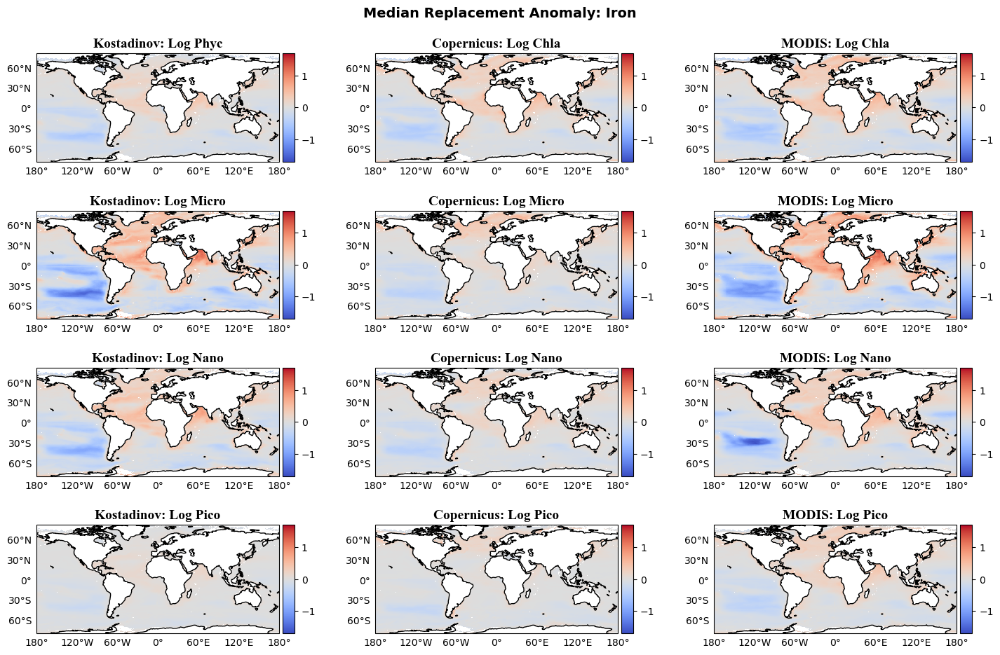

In [58]:
median_plot(
    datasets_dfe,
    title='Median Replacement Anomaly',
    name= 'med_anom_dfe_plot.jpg',
    vmin=-1.7, 
    vmax=1.7,
    # levels=35,
    feature='Iron'
)

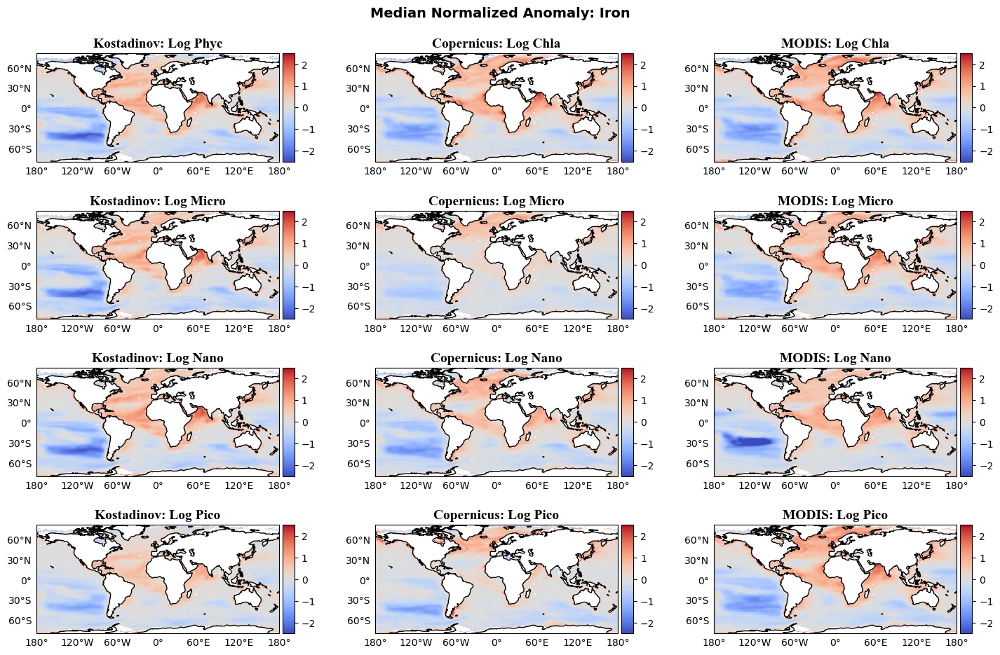

In [59]:
median_plot(
    datasets_dfe,
    title='Median Normalized Anomaly',
    name='med_anom_norm_dfe.jpg',
    vmin=-2.5, 
    vmax=2.5,
    # levels=31,
    feature='Iron',
    norm=True
)

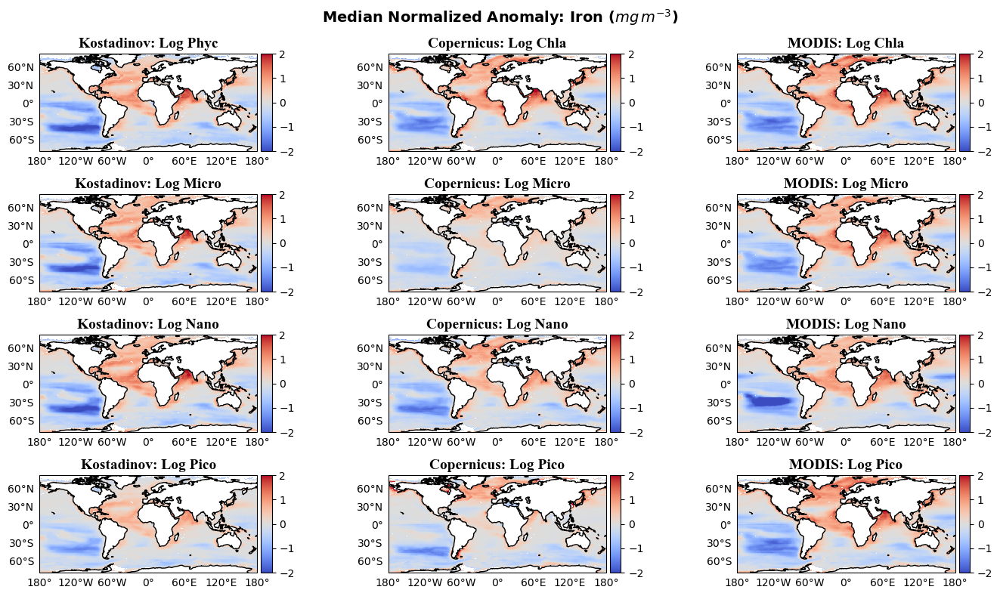

In [60]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Font settings
font = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 14, 'fontweight': 'bold'}
fonttxt = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 12}

fig = plt.figure(figsize=(14, 8), dpi=100)
gs = fig.add_gridspec(4, 3)

for i, data in enumerate(datasets_dfe):
    ax = fig.add_subplot(gs[i], projection=ccrs.PlateCarree())

    pred = dfe5m[data['psc'] + '_pred']
    med = dfe5m[data['psc'] + '_med']
    base = dfe5m[data['psc']].std()
    anom = (pred - med) / base
    # anom = pred - med

    # Plot without colorbar
    im = anom.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap='coolwarm',
        vmin=-2.0,
        vmax=2.0,
        # robust=True,
        add_colorbar=False
    )    

    # Create a small colorbar axis next to the subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05, axes_class=plt.Axes)
    fig.colorbar(im, cax=cax, orientation='vertical')

    ax.set_title(data['title'], fontdict=font)
    ax.coastlines()
    # Add latitude and longitude gridlines
    gl = ax.gridlines(draw_labels=True)
    gl.xlines = False  # Hide longitude grid lines
    gl.ylines = False  # Hide latitude grid lines
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10}
    gl.ylabel_style = {'size': 10}

# Hide unused subplots
for j in range(len(datasets_dfe), 12):
    fig.add_subplot(gs[j]).axis('off')
plt.suptitle("Median Normalized Anomaly: Iron (${mg}\,{m^{-3}}$)", fontsize=14, fontweight='bold')
plt.tight_layout()
# fig.savefig(chartpath + 'med_anom_norm_dfe_plot.jpg', dpi=200, bbox_inches='tight')
plt.show()

#### Shortwave Radiation

In [61]:
Xs5rsn = median_dataset(Xs, 'rsn')

                         dfe       mld       nh4       no3       po4  \
lat   month lon                                                        
-77.5 1     -178.5  0.208484  0.506408  4.231577  3.450822  4.077281   
            -177.5  0.205167  0.491433  4.014312  3.567460  4.129741   
            -176.5  0.235446  0.478328  3.806712  3.678837  4.184831   
            -175.5  0.202580  0.467861  3.602718  3.776644  4.234338   
            -174.5  0.239541  0.460787  3.368932  3.859270  4.277099   
...                      ...       ...       ...       ...       ...   
 82.5 12    -16.5   0.971301  0.050043  0.393080  0.518626  3.920360   
            -10.5   0.966341  0.041400  0.303271  0.749604  3.273980   
            -9.5    0.915825  0.076397  0.300927  0.809711  3.223028   
             68.5   0.993909  0.437664  0.411516  0.861293  1.217271   
             81.5   1.045468  0.382826  0.394482  0.897841  1.635452   

                         rsn       sal       sst       sil     

In [62]:
rsn5m = dataset_prep(dp, Xs5rsn)
rsn5m

<xarray.Dataset> Size: 14MB
Dimensions:        (lat: 161, lon: 360)
Coordinates:
  * lat            (lat) float64 1kB -77.5 -76.5 -75.5 -74.5 ... 80.5 81.5 82.5
  * lon            (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Data variables: (12/36)
    logphyck       (lat, lon) float32 232kB nan 1.102 1.089 ... nan nan nan
    logmcrok       (lat, lon) float32 232kB nan 0.7886 0.8086 ... nan nan nan
    lognanok       (lat, lon) float32 232kB nan 0.921 0.9276 ... nan nan nan
    logpicok       (lat, lon) float32 232kB nan 0.5128 0.5023 ... nan nan nan
    logchlac       (lat, lon) float32 232kB nan -0.8178 -0.594 ... nan nan nan
    logmcroc       (lat, lon) float32 232kB nan -0.4624 -0.2878 ... nan nan nan
    ...             ...
    lognanoc_med   (lat, lon) float64 464kB nan -1.066 -1.068 ... nan nan nan
    logpicoc_med   (lat, lon) float64 464kB nan -1.003 -1.01 ... nan nan nan
    logchlam_med   (lat, lon) float64 464kB nan -0.1859 -0.1974 ... nan nan nan
    logmcrom_med   (lat, lon) float64 464kB nan -0.6671 -0.6965 ... nan nan nan
    lognanom_med   (lat, lon) float64 464kB nan -0.7252 -0.7336 ... nan nan nan
    logpicom_med   (lat, lon) float64 464kB nan -0.8537 -0.8596 ... nan nan nan

In [63]:
# aphyck_rsn = ((rsn5m['logphyck_pred'] - rsn5m['logphyck_med']) / rsn5m['logphyck'].std())
# amcrok_rsn = ((rsn5m['logmcrok_pred'] - rsn5m['logmcrok_med']) / rsn5m['logmcrok'].std())
# ananok_rsn = ((rsn50['lognanok_pred'] - rsn50['lognanok_med']) / rsn5m['lognanok'].std())
# apicok_rsn = ((rsn50['logpicok_pred'] - rsn50['logpicok_med']) / rsn5m['logpicok'].std())

aphyck_rsn = (rsn5m['logphyck_pred'] - rsn5m['logphyck_med'])
amcrok_rsn = (rsn5m['logmcrok_pred'] - rsn5m['logmcrok_med'])
ananok_rsn = (rsn5m['lognanok_pred'] - rsn5m['lognanok_med'])
apicok_rsn = (rsn5m['logpicok_pred'] - rsn5m['logpicok_med'])

print(aphyck_rsn.min().values, aphyck_rsn.max().values)
print(amcrok_rsn.min().values, amcrok_rsn.max().values)
print(apicok_rsn.min().values, apicok_rsn.max().values)
print(ananok_rsn.min().values, ananok_rsn.max().values)

-0.8807453247261121 0.15101348037181794
-1.428349437874501 0.2381689923094215
-0.9118242499151492 0.03964474580981292
-1.1313399734796474 0.1498695731519779


In [64]:
# Define datasets and titles
datasets_rsn = [
    {'df': rsn5m, 'psc': 'logphyck', 'title': 'Kostadinov: Log Phyc'},
    {'df': rsn5m, 'psc': 'logchlac', 'title': 'Copernicus: Log Chla'},
    {'df': rsn5m, 'psc': 'logchlam', 'title': 'MODIS: Log Chla'},
    {'df': rsn5m, 'psc': 'logmcrok', 'title': 'Kostadinov: Log Micro'},
    {'df': rsn5m, 'psc': 'logmcroc', 'title': 'Copernicus: Log Micro'},
    {'df': rsn5m, 'psc': 'logmcrom', 'title': 'MODIS: Log Micro'},
    {'df': rsn5m, 'psc': 'lognanok', 'title': 'Kostadinov: Log Nano'},
    {'df': rsn5m, 'psc': 'lognanoc', 'title': 'Copernicus: Log Nano'},
    {'df': rsn5m, 'psc': 'lognanom', 'title': 'MODIS: Log Nano'},
    {'df': rsn5m, 'psc': 'logpicok', 'title': 'Kostadinov: Log Pico'},
    {'df': rsn5m, 'psc': 'logpicoc', 'title': 'Copernicus: Log Pico'},
    {'df': rsn5m, 'psc': 'logpicom', 'title': 'MODIS: Log Pico'}
]

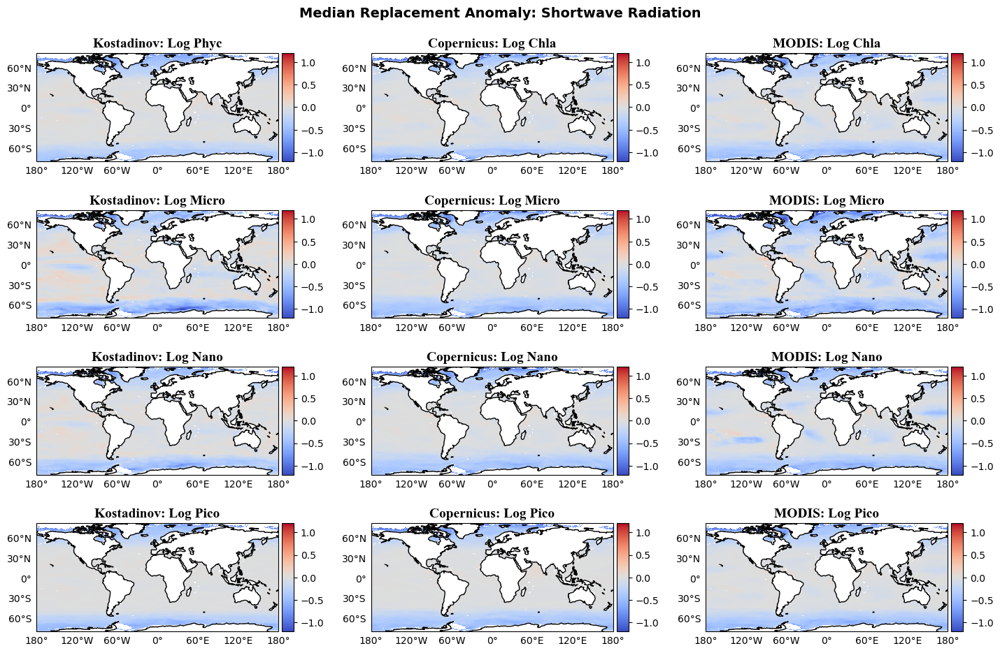

In [65]:
median_plot(
    datasets_rsn,
    title='Median Replacement Anomaly',
    name= 'med_anom_rsn_plot.jpg',
    vmin=-1.2, 
    vmax=1.2, 
    feature='Shortwave Radiation'
)

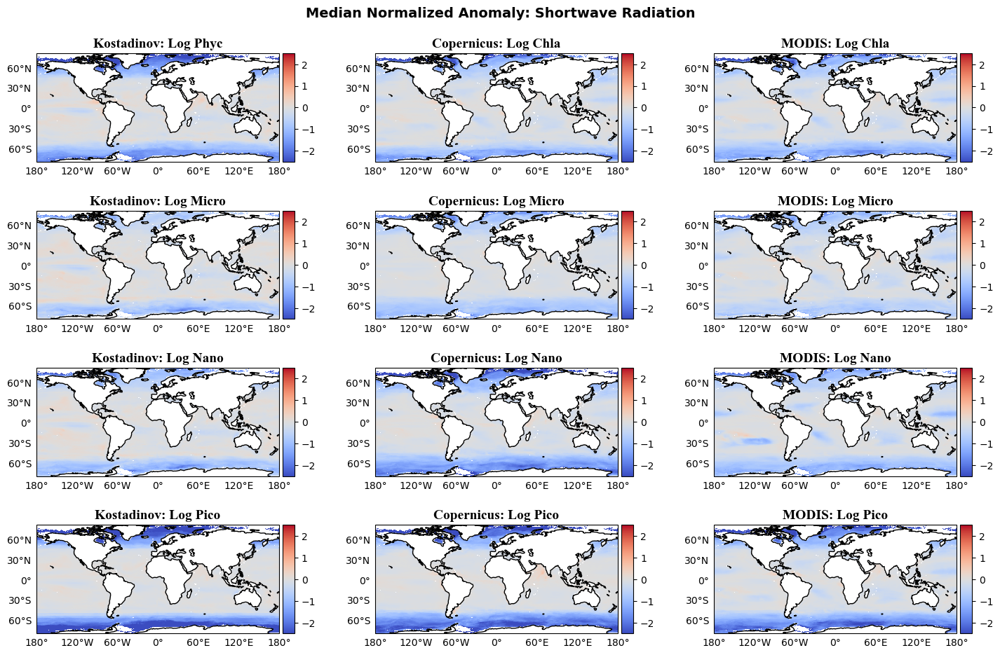

In [66]:
median_plot(
    datasets_rsn,
    title='Median Normalized Anomaly',
    name= 'med_anom_norm_rsn_plot.jpg',
    vmin=-2.5, 
    vmax=2.5, 
    feature='Shortwave Radiation',
    norm=True
)

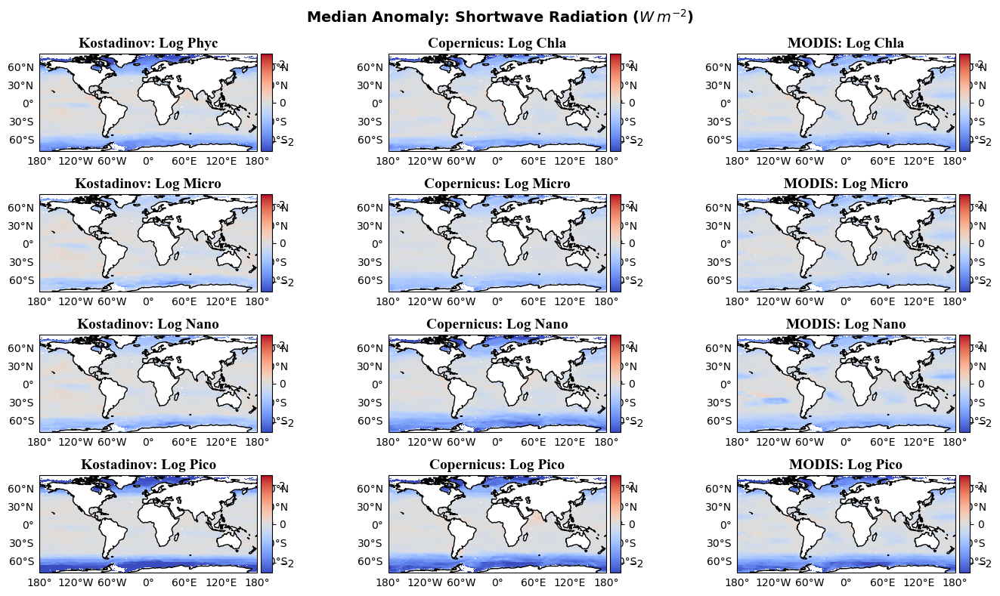

In [67]:
# Font settings
font = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 14, 'fontweight': 'bold'}
fonttxt = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 12}

fig = plt.figure(figsize=(14, 8), dpi=100)
gs = fig.add_gridspec(4, 3)

for i, data in enumerate(datasets_rsn):
    ax = fig.add_subplot(gs[i], projection=ccrs.PlateCarree())

    pred = rsn5m[data['psc'] + '_pred']
    med = rsn5m[data['psc'] + '_med']
    base = rsn5m[data['psc']].std()
    anom = (pred - med) / base
    # anom = pred - med

    # Plot without colorbar
    im = anom.plot(
        ax=ax,
        transform=ccrs.PlateCarree(), 
        cmap='coolwarm',
        # robust=True,
        vmin=-2.5,
        vmax=2.5,
        add_colorbar=False
    )

    # Create a small colorbar axis next to the subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05, axes_class=plt.Axes)
    fig.colorbar(im, cax=cax, orientation='vertical')

    ax.set_title(data['title'], fontdict=font)
    ax.coastlines()
    # Add latitude and longitude gridlines
    gl = ax.gridlines(draw_labels=True)
    gl.xlines = False  # Hide longitude grid lines
    gl.ylines = False  # Hide latitude grid lines
    gl.top_labels = False
    gl.xlabel_style = {'size': 10}
    gl.ylabel_style = {'size': 10}

# Hide unused subplots
for j in range(len(datasets_rsn), 12):
    fig.add_subplot(gs[j]).axis('off')

plt.suptitle("Median Anomaly: Shortwave Radiation (${W}\,{m^{-2}}$)", fontsize=14, fontweight="bold")
plt.tight_layout()
# fig.savefig(chartpath + "med_anom_norm_rsn_plot.jpg",dpi=200,bbox_inches='tight')
plt.show()

#### SST

In [68]:
Xs5sst = median_dataset(Xs, 'sst')

                         dfe       mld       nh4       no3       po4  \
lat   month lon                                                        
-77.5 1     -178.5  0.208484  0.506408  4.231577  3.450822  4.077281   
            -177.5  0.205167  0.491433  4.014312  3.567460  4.129741   
            -176.5  0.235446  0.478328  3.806712  3.678837  4.184831   
            -175.5  0.202580  0.467861  3.602718  3.776644  4.234338   
            -174.5  0.239541  0.460787  3.368932  3.859270  4.277099   
...                      ...       ...       ...       ...       ...   
 82.5 12    -16.5   0.971301  0.050043  0.393080  0.518626  3.920360   
            -10.5   0.966341  0.041400  0.303271  0.749604  3.273980   
            -9.5    0.915825  0.076397  0.300927  0.809711  3.223028   
             68.5   0.993909  0.437664  0.411516  0.861293  1.217271   
             81.5   1.045468  0.382826  0.394482  0.897841  1.635452   

                         rsn       sal       sst       sil     

In [69]:
sst5m = dataset_prep(dp, Xs5sst)
sst5m

<xarray.Dataset> Size: 14MB
Dimensions:        (lat: 161, lon: 360)
Coordinates:
  * lat            (lat) float64 1kB -77.5 -76.5 -75.5 -74.5 ... 80.5 81.5 82.5
  * lon            (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Data variables: (12/36)
    logphyck       (lat, lon) float32 232kB nan 1.102 1.089 ... nan nan nan
    logmcrok       (lat, lon) float32 232kB nan 0.7886 0.8086 ... nan nan nan
    lognanok       (lat, lon) float32 232kB nan 0.921 0.9276 ... nan nan nan
    logpicok       (lat, lon) float32 232kB nan 0.5128 0.5023 ... nan nan nan
    logchlac       (lat, lon) float32 232kB nan -0.8178 -0.594 ... nan nan nan
    logmcroc       (lat, lon) float32 232kB nan -0.4624 -0.2878 ... nan nan nan
    ...             ...
    lognanoc_med   (lat, lon) float64 464kB nan -1.526 -1.53 ... nan nan nan
    logpicoc_med   (lat, lon) float64 464kB nan -1.456 -1.458 ... nan nan nan
    logchlam_med   (lat, lon) float64 464kB nan -0.6931 -0.7122 ... nan nan nan
    logmcrom_med   (lat, lon) float64 464kB nan -1.293 -1.295 ... nan nan nan
    lognanom_med   (lat, lon) float64 464kB nan -1.213 -1.218 ... nan nan nan
    logpicom_med   (lat, lon) float64 464kB nan -1.345 -1.35 ... nan nan nan

In [70]:
# Define datasets and titles
datasets_sst = [
    {'df': sst5m, 'psc': 'logphyck', 'title': 'Kostadinov : Log Phyc'},
    {'df': sst5m, 'psc': 'logchlac', 'title': 'Copernicus : Log Chla'},
    {'df': sst5m, 'psc': 'logchlam', 'title': 'MODIS : Log Chla'},
    {'df': sst5m, 'psc': 'logmcrok', 'title': 'Kostadinov : Log Micro'},
    {'df': sst5m, 'psc': 'logmcroc', 'title': 'Copernicus : Log Micro'},
    {'df': sst5m, 'psc': 'logmcrom', 'title': 'MODIS : Log Micro'},
    {'df': sst5m, 'psc': 'lognanok', 'title': 'Kostadinov : Log Nano'},
    {'df': sst5m, 'psc': 'lognanoc', 'title': 'Copernicus : Log Nano'},
    {'df': sst5m, 'psc': 'lognanom', 'title': 'MODIS : Log Nano'},
    {'df': sst5m, 'psc': 'logpicok', 'title': 'Kostadinov : Log Pico'},
    {'df': sst5m, 'psc': 'logpicoc', 'title': 'Copernicus : Log Pico'},
    {'df': sst5m, 'psc': 'logpicom', 'title': 'MODIS : Log Pico'}
]

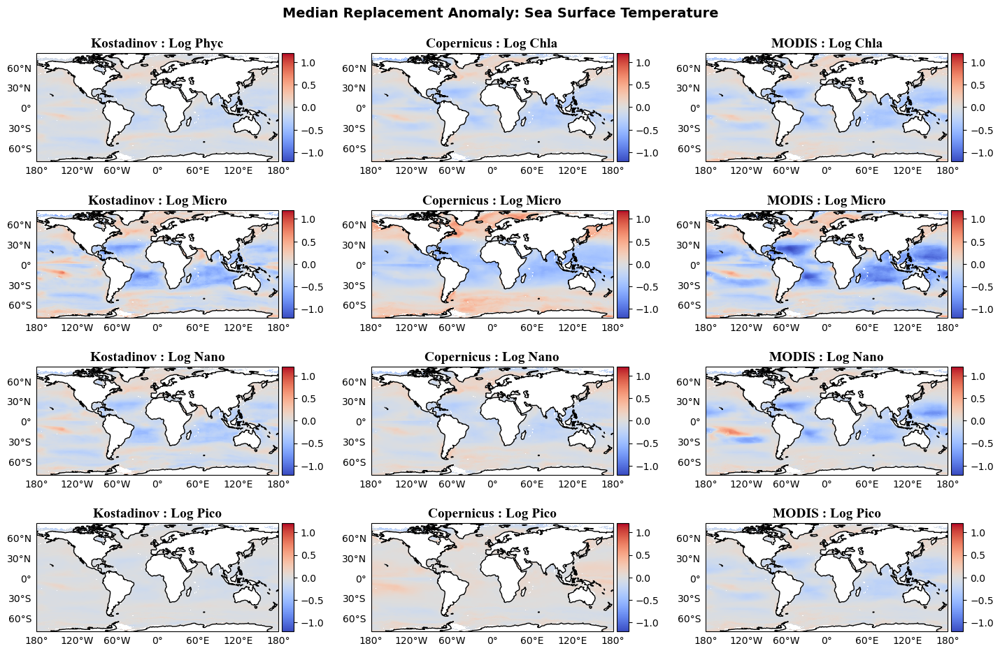

In [71]:
median_plot(
    datasets_sst,
    title='Median Replacement Anomaly',
    name= 'med_anom_sst_plot.jpg',
    vmin=-1.2, 
    vmax=1.2, 
    feature='Sea Surface Temperature'
)

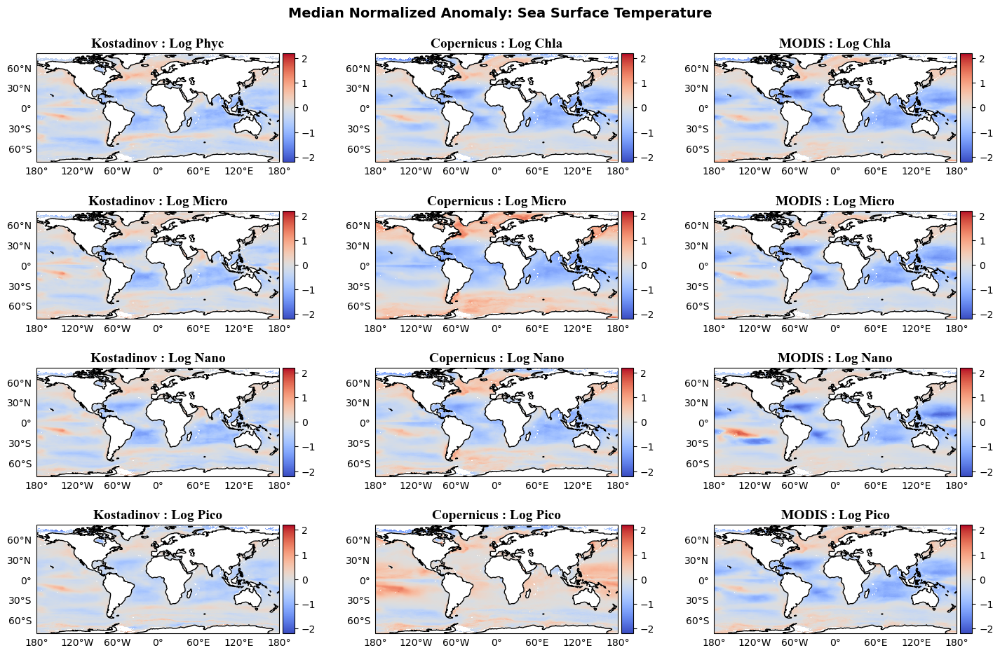

In [72]:
median_plot(
    datasets_sst,
    title='Median Normalized Anomaly',
    name= 'med_anom_norm_sst_plot.jpg',
    vmin=-2.2, 
    vmax=2.2, 
    feature='Sea Surface Temperature',
    norm=True    
)

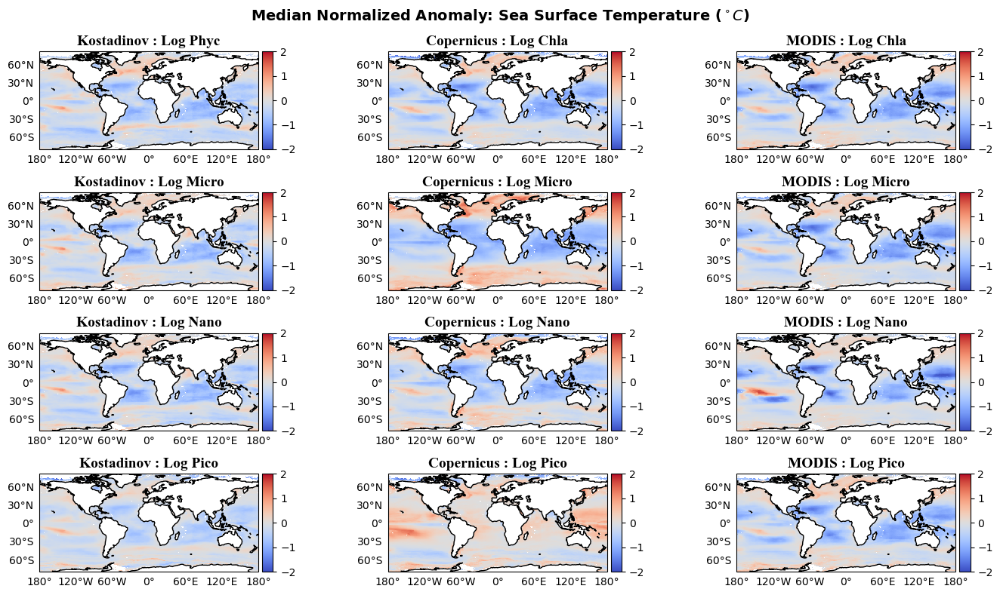

In [73]:
# Font settings
font = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 14, 'fontweight': 'bold'}
fonttxt = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 12}

fig = plt.figure(figsize=(14, 8), dpi=100)
gs = fig.add_gridspec(4, 3)

for i, data in enumerate(datasets_sst):
    ax = fig.add_subplot(gs[i], projection=ccrs.PlateCarree())

    pred = sst5m[data['psc'] + '_pred']
    med = sst5m[data['psc'] + '_med']
    base = sst5m[data['psc']].std()
    anom = (pred - med) / base
    # anom = pred - med

    # Plot without colorbar
    # Correct way in case of plotting data as a heatmap/image
    im = anom.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        # robust=True,
        vmin=-2.0,
        vmax=2.0,
        add_colorbar=False,  # This will add the color bar
        cmap='coolwarm'
        )

    # Create a small colorbar axis next to the subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05, axes_class=plt.Axes)
    fig.colorbar(im, cax=cax, orientation='vertical')

    ax.set_title(data['title'], fontdict=font)
    ax.coastlines()
    # Add latitude and longitude gridlines
    gl = ax.gridlines(draw_labels=True)
    gl.xlines = False  # Hide longitude grid lines
    gl.ylines = False  # Hide latitude grid lines
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10}
    gl.ylabel_style = {'size': 10}

# Hide unused subplots
for j in range(len(datasets_sst), 12):
    fig.add_subplot(gs[j]).axis('off')

plt.suptitle("Median Normalized Anomaly: Sea Surface Temperature ($^\circ C$)", fontsize=14, fontweight="bold")
plt.tight_layout()
# fig.savefig(chartpath + "med_anom_norm_sst_plot.jpg",dpi=200,bbox_inches='tight')
plt.show()

#### NH4

In [74]:
Xs5nh4 = median_dataset(Xs, 'nh4')
Xs5nh4

                         dfe       mld       nh4       no3       po4  \
lat   month lon                                                        
-77.5 1     -178.5  0.208484  0.506408  0.797407  3.450822  4.077281   
            -177.5  0.205167  0.491433  0.797407  3.567460  4.129741   
            -176.5  0.235446  0.478328  0.797407  3.678837  4.184831   
            -175.5  0.202580  0.467861  0.797407  3.776644  4.234338   
            -174.5  0.239541  0.460787  0.797407  3.859270  4.277099   
...                      ...       ...       ...       ...       ...   
 82.5 12    -16.5   0.971301  0.050043  0.797407  0.518626  3.920360   
            -10.5   0.966341  0.041400  0.797407  0.749604  3.273980   
            -9.5    0.915825  0.076397  0.797407  0.809711  3.223028   
             68.5   0.993909  0.437664  0.797407  0.861293  1.217271   
             81.5   1.045468  0.382826  0.797407  0.897841  1.635452   

                         rsn       sal       sst       sil     

dfe       mld       nh4       no3       po4  \
lat   month lon                                                        
-77.5 1     -178.5  0.208484  0.506408  0.797407  3.450822  4.077281   
            -177.5  0.205167  0.491433  0.797407  3.567460  4.129741   
            -176.5  0.235446  0.478328  0.797407  3.678837  4.184831   
            -175.5  0.202580  0.467861  0.797407  3.776644  4.234338   
            -174.5  0.239541  0.460787  0.797407  3.859270  4.277099   
...                      ...       ...       ...       ...       ...   
 82.5 12    -16.5   0.971301  0.050043  0.797407  0.518626  3.920360   
            -10.5   0.966341  0.041400  0.797407  0.749604  3.273980   
            -9.5    0.915825  0.076397  0.797407  0.809711  3.223028   
             68.5   0.993909  0.437664  0.797407  0.861293  1.217271   
             81.5   1.045468  0.382826  0.797407  0.897841  1.635452   

                         rsn       sal       sst       sil       w50  
lat   month lon                                                       
-77.5 1     -178.5  4.014052  8.057380  0.469185  4.552131  5.115657  
            -177.5  3.865146  8.053420  0.452645  4.522581  5.106133  
            -176.5  3.925302  8.049719  0.437974  4.497089  5.074835  
            -175.5  3.925302  8.046313  0.425598  4.470600  5.033265  
            -174.5  3.741394  8.043292  0.415659  4.442318  4.965065  
...                      ...       ...       ...       ...       ...  
 82.5 12    -16.5   0.000000  6.813716  0.119151  0.985409  4.867644  
            -10.5   0.000000  7.207470  0.181857  0.954052  4.919585  
            -9.5    0.000000  7.269585  0.220375  0.876670  4.932672  
             68.5   0.000000  7.926335  0.026283  0.494625  5.051017  
             81.5   0.000000  7.713524  0.045882  0.654257  5.054749  

[430200 rows x 10 columns]

In [75]:
nh45m = dataset_prep(dp, Xs5nh4)
nh45m

<xarray.Dataset> Size: 14MB
Dimensions:        (lat: 161, lon: 360)
Coordinates:
  * lat            (lat) float64 1kB -77.5 -76.5 -75.5 -74.5 ... 80.5 81.5 82.5
  * lon            (lon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Data variables: (12/36)
    logphyck       (lat, lon) float32 232kB nan 1.102 1.089 ... nan nan nan
    logmcrok       (lat, lon) float32 232kB nan 0.7886 0.8086 ... nan nan nan
    lognanok       (lat, lon) float32 232kB nan 0.921 0.9276 ... nan nan nan
    logpicok       (lat, lon) float32 232kB nan 0.5128 0.5023 ... nan nan nan
    logchlac       (lat, lon) float32 232kB nan -0.8178 -0.594 ... nan nan nan
    logmcroc       (lat, lon) float32 232kB nan -0.4624 -0.2878 ... nan nan nan
    ...             ...
    lognanoc_med   (lat, lon) float64 464kB nan -1.544 -1.548 ... nan nan nan
    logpicoc_med   (lat, lon) float64 464kB nan -1.429 -1.428 ... nan nan nan
    logchlam_med   (lat, lon) float64 464kB nan -0.6001 -0.6097 ... nan nan nan
    logmcrom_med   (lat, lon) float64 464kB nan -1.163 -1.196 ... nan nan nan
    lognanom_med   (lat, lon) float64 464kB nan -1.196 -1.203 ... nan nan nan
    logpicom_med   (lat, lon) float64 464kB nan -1.327 -1.33 ... nan nan nan

In [76]:
# Define datasets and titles
datasets_nh4 = [
    {'df': nh45m, 'psc': 'logphyck', 'title': 'Kostadinov : Log Phyc'},
    {'df': nh45m, 'psc': 'logchlac', 'title': 'Copernicus : Log Chla'},
    {'df': nh45m, 'psc': 'logchlam', 'title': 'MODIS : Log Chla'},
    {'df': nh45m, 'psc': 'logmcrok', 'title': 'Kostadinov : Log Micro'},
    {'df': nh45m, 'psc': 'logmcroc', 'title': 'Copernicus : Log Micro'},
    {'df': nh45m, 'psc': 'logmcrom', 'title': 'MODIS : Log Micro'},
    {'df': nh45m, 'psc': 'lognanok', 'title': 'Kostadinov : Log Nano'},
    {'df': nh45m, 'psc': 'lognanoc', 'title': 'Copernicus : Log Nano'},
    {'df': nh45m, 'psc': 'lognanom', 'title': 'MODIS : Log Nano'},
    {'df': nh45m, 'psc': 'logpicok', 'title': 'Kostadinov : Log Pico'},
    {'df': nh45m, 'psc': 'logpicoc', 'title': 'Copernicus : Log Pico'},
    {'df': nh45m, 'psc': 'logpicom', 'title': 'MODIS : Log Pico'}
]

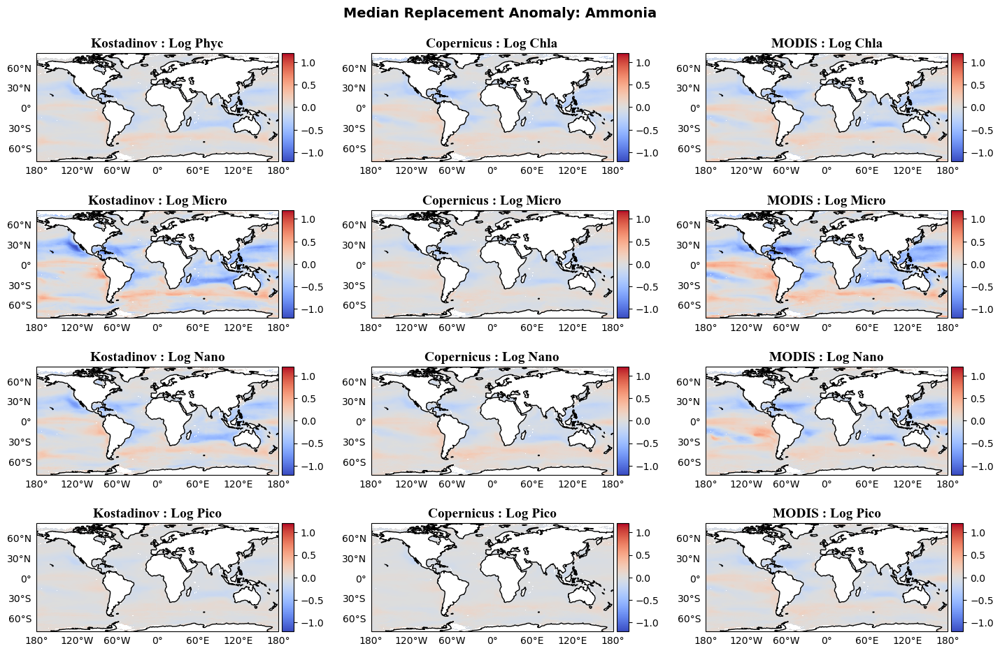

In [77]:
median_plot(
    datasets_nh4,
    title='Median Replacement Anomaly',
    name= 'med_anom_nh4_plot.jpg',
    vmin=-1.2, 
    vmax=1.2, 
    feature='Ammonia'
)

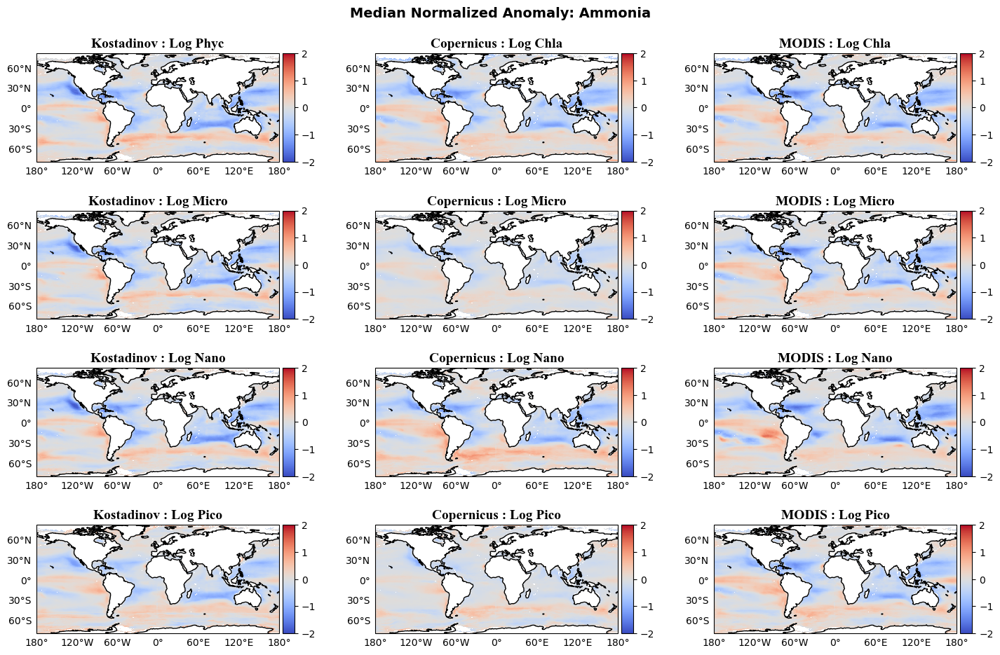

In [78]:
median_plot(
    datasets_nh4,
    title='Median Normalized Anomaly',
    name= 'med_anom_norm_nh4_plot.jpg',
    vmin=-2.0, 
    vmax=2.0, 
    feature='Ammonia',
    norm=True    
)

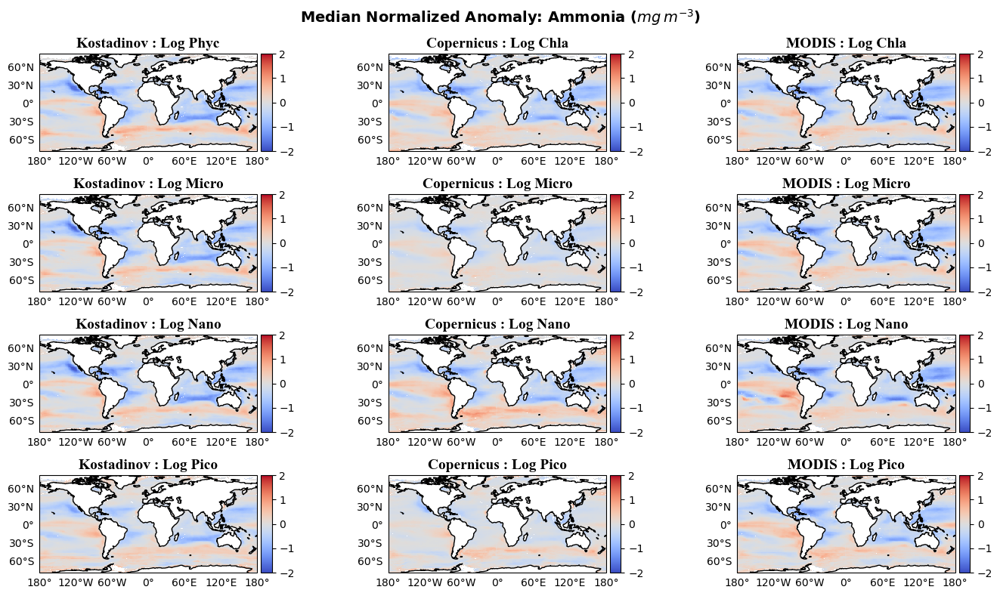

In [79]:
# Font settings
font = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 14, 'fontweight': 'bold'}
fonttxt = {'family': 'Times New Roman', 'color': 'black', 'fontsize': 12}

fig = plt.figure(figsize=(14, 8), dpi=100)
gs = fig.add_gridspec(4, 3)

for i, data in enumerate(datasets_nh4):
    ax = fig.add_subplot(gs[i], projection=ccrs.PlateCarree())

    pred = nh45m[data['psc'] + '_pred']
    med = nh45m[data['psc'] + '_med']
    base = nh45m[data['psc']].std()
    anom = (pred - med) / base
    # anom = pred - med

    # Plot without colorbar
    # Correct way in case of plotting data as a heatmap/image
    im = anom.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        # robust=True,
        vmin=-2.0,
        vmax=2.0,
        add_colorbar=False,  # This will add the color bar
        cmap='coolwarm'
        )

    # Create a small colorbar axis next to the subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05, axes_class=plt.Axes)
    fig.colorbar(im, cax=cax, orientation='vertical')

    ax.set_title(data['title'], fontdict=font)
    ax.coastlines()
    # Add latitude and longitude gridlines
    gl = ax.gridlines(draw_labels=True)
    gl.xlines = False  # Hide longitude grid lines
    gl.ylines = False  # Hide latitude grid lines
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10}
    gl.ylabel_style = {'size': 10}

# Hide unused subplots
for j in range(len(datasets_nh4), 12):
    fig.add_subplot(gs[j]).axis('off')

plt.suptitle("Median Normalized Anomaly: Ammonia (${mg}\,{m^{-3}}$)", fontsize=14, fontweight="bold")
plt.tight_layout()
fig.savefig(chartpath + "med_anom_norm_nh4_plot.jpg",dpi=200,bbox_inches='tight')
plt.show()

In [80]:
1

1